Written by NDV in spring of 2024 while trying to debug why kaggle submissions are poor (less than 20% score)

In [1]:
import os
import pandas as pd
import numpy as np

/tmp/8129943.1.csg.q/ipykernel_2129318/1576438456.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
df = pd.read_csv("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/Master_fovHPA_512.csv")

In [4]:
df

,Path,prev_Path,source,org_size,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,whole_images/512_whole_images/49232_769_H3_1.tiff,HPA_FOV/512_whole_images/49232_769_H3_1.tiff,Website,2048x2048,['vesicles'],A-431,49232_769_H3_1,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,whole_images/512_whole_images/49232_769_H3_11....,HPA_FOV/512_whole_images/49232_769_H3_11.tiff,Website,2048x2048,['vesicles'],A-431,49232_769_H3_11,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,whole_images/512_whole_images/49232_761_H3_1.tiff,HPA_FOV/512_whole_images/49232_761_H3_1.tiff,Website,2048x2048,['vesicles'],U-2 OS,49232_761_H3_1,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,whole_images/512_whole_images/49232_761_H3_2.tiff,HPA_FOV/512_whole_images/49232_761_H3_2.tiff,Website,2048x2048,['vesicles'],U-2 OS,49232_761_H3_2,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,whole_images/512_whole_images/49232_757_H3_1.tiff,HPA_FOV/512_whole_images/49232_757_H3_1.tiff,Website,2048x2048,['vesicles'],U-251 MG,49232_757_H3_1,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113540,whole_images/512_whole_images/ffed4430-bbac-11...,HPA_FOV/512_whole_images/ffed4430-bbac-11e8-b2...,Kaggle,3072x3072,['plasma membrane'],ASC TERT1,ffed4430-bbac-11e8-b2ba-ac1f6b6435d0,False,False,False,...,False,False,False,False,False,False,False,False,False,False
113541,whole_images/512_whole_images/fff0a998-bbae-11...,HPA_FOV/512_whole_images/fff0a998-bbae-11e8-b2...,Kaggle,2048x2048,['nuclear bodies'],BJ,fff0a998-bbae-11e8-b2ba-ac1f6b6435d0,False,False,False,...,False,False,False,False,False,False,False,False,False,False
113542,whole_images/512_whole_images/fff189d8-bbab-11...,HPA_FOV/512_whole_images/fff189d8-bbab-11e8-b2...,Kaggle,2048x2048,['golgi apparatus'],HeLa,fff189d8-bbab-11e8-b2ba-ac1f6b6435d0,False,False,False,...,False,False,False,False,False,False,False,False,False,False
113543,whole_images/512_whole_images/fffdf7e0-bbc4-11...,HPA_FOV/512_whole_images/fffdf7e0-bbc4-11e8-b2...,Kaggle,2048x2048,"['cytosol', 'nucleoli', 'plasma membrane']",A-431,fffdf7e0-bbc4-11e8-b2bc-ac1f6b6435d0,False,False,True,...,False,False,False,False,False,False,False,False,False,False


In [8]:
test = pd.read_csv("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/kaggle_test_data_direct.csv")

In [11]:
test["ID"].isin(df["ID"]).any()

False

In [12]:
res = [df['ID'].str.contains(d) for d in test["ID"]]

In [5]:
import torch

In [5]:
fts = torch.load("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/DINO_features_for_HPA_FOV.pth")

In [25]:
fts[3]

['49232_769_H3_1',
 '49232_769_H3_11',
 '49232_761_H3_1',
 '49232_761_H3_2',
 '49232_757_H3_1',
 '49232_757_H3_2',
 '32138_415_D1_1',
 '32138_415_D1_2',
 '32138_411_D1_1',
 '32138_411_D1_3',
 '32138_416_D1_1',
 '32138_416_D1_2',
 '4715_1501_H1_1',
 '4715_1501_H1_2',
 '4715_1494_D1_1',
 '4715_1494_D1_2',
 '4715_1522_H1_1',
 '4715_1522_H1_5',
 '50530_816_F9_1',
 '50530_816_F9_2',
 '50530_777_F9_1',
 '50530_777_F9_2',
 '50530_790_F9_1',
 '50530_790_F9_2',
 '67651_1368_C3_3',
 '67651_1368_C3_4',
 '67651_1283_F7_2',
 '67651_1283_F7_5',
 '67651_1286_F7_4',
 '67651_1286_F7_9',
 '72407_1576_A7_1',
 '72407_1576_A7_3',
 '72407_1403_A5_1',
 '72407_1403_A5_2',
 '72407_1398_A5_1',
 '72407_1398_A5_2',
 '53611_826_D8_1',
 '53611_826_D8_2',
 '53611_809_D8_1',
 '53611_809_D8_2',
 '53611_819_D8_1',
 '53611_819_D8_2',
 '44629_824_C1_2',
 '44629_824_C1_3',
 '44629_978_C1_1',
 '44629_978_C1_2',
 '44629_884_C1_1',
 '44629_884_C1_3',
 '47833_1365_D4_1',
 '47833_1365_D4_2',
 '47833_1320_G1_3',
 '47833_1320_G1

## test images prep

In [18]:
df

NameError: name 'df' is not defined

In [6]:
import matplotlib.pyplot as plt
from skimage import io
from pathlib import Path
from tqdm.notebook import tqdm

In [7]:
path = "/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/test/"
outpath = "/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_test/"
fns = os.listdir(path)
Path(outpath).mkdir(parents=True, exist_ok=True)


In [ ]:
fns = pd.Series(fns)
fns = fns.str.split(".").str[0].str.split("_").str[0].unique()

for fn in fns:
    image = []
    # base_file_name = fn.split('.')[0].split("_")[0]
    for channel in ['blue','green','red','yellow']:
        img_file = path + fn + f'_{channel}.png'
        im = io.imread(img_file)
        image.append(im)
    image =  np.stack(image)
    io.imsave(f"{outpath}{fn}.tiff", image)

/tmp/8010046.1.all.q/ipykernel_440438/272474526.py:12: UserWarning: /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_test/091df990-bacd-11e8-b2b8-ac1f6b6435d0.tiff is a low contrast image
  io.imsave(f"{outpath}{fn}.tiff", image)
/tmp/8010046.1.all.q/ipykernel_440438/272474526.py:12: UserWarning: /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_test/0cab24d6-bac6-11e8-b2b7-ac1f6b6435d0.tiff is a low contrast image
  io.imsave(f"{outpath}{fn}.tiff", image)
/tmp/8010046.1.all.q/ipykernel_440438/272474526.py:12: UserWarning: /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_test/0f8cef6c-badb-11e8-b2b9-ac1f6b6435d0.tiff is a low contrast image
  io.imsave(f"{outpath}{fn}.tiff", image)
/tmp/8010046.1.all.q/ipykernel_440438/272474526.py:12: UserWarning: /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_test/13e2d52e-bad9-11e8-b2b9-ac1f6b6435d0.tiff is a low contrast image
  io.imsave(f"{outpath}{fn}.tiff", image)
/tmp/8010046.1.all.q/ipy

In [7]:
test_df = pd.DataFrame(fns, columns=["Path"])
test_df["ID"] = fns
test_df["Path"] = "whole_images/512_HPA_FOV_test/" + test_df["Path"] + ".tiff"

NameError: name 'pd' is not defined

In [126]:
test_df.to_csv("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/Kaggle_test_fovHPA_512.csv", index=False)

In [127]:
test_df

,Path,ID
0,whole_images/512_HPA_FOV_test/00008af0-bad0-11...,00008af0-bad0-11e8-b2b8-ac1f6b6435d0
1,whole_images/512_HPA_FOV_test/0000a892-bacf-11...,0000a892-bacf-11e8-b2b8-ac1f6b6435d0
2,whole_images/512_HPA_FOV_test/0006faa6-bac7-11...,0006faa6-bac7-11e8-b2b7-ac1f6b6435d0
3,whole_images/512_HPA_FOV_test/0008baca-bad7-11...,0008baca-bad7-11e8-b2b9-ac1f6b6435d0
4,whole_images/512_HPA_FOV_test/000cce7e-bad4-11...,000cce7e-bad4-11e8-b2b8-ac1f6b6435d0
...,...,...
11697,whole_images/512_HPA_FOV_test/ffdfb96a-bad4-11...,ffdfb96a-bad4-11e8-b2b8-ac1f6b6435d0
11698,whole_images/512_HPA_FOV_test/ffdfc590-bad4-11...,ffdfc590-bad4-11e8-b2b8-ac1f6b6435d0
11699,whole_images/512_HPA_FOV_test/ffecb8a4-bad4-11...,ffecb8a4-bad4-11e8-b2b8-ac1f6b6435d0
11700,whole_images/512_HPA_FOV_test/fff03816-bad5-11...,fff03816-bad5-11e8-b2b9-ac1f6b6435d0


## Classifier prep

### 4D setup

In [15]:
fts = torch.load("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/DINO_features_for_HPA_FOV.pth")

In [16]:
fts_ids = pd.Series(fts[-1])

In [17]:
train_idx = torch.load("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/fovHPA_train_IDs_proteinloc.pth")
valid_idx = torch.load("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/fovHPA_valid_IDs_proteinloc.pth")

In [18]:
train_idx

array(['10005_921_B9_2', '10005_923_B9_2', '10005_931_B9_2', ...,
       'fff189d8-bbab-11e8-b2ba-ac1f6b6435d0',
       'fffdf7e0-bbc4-11e8-b2bc-ac1f6b6435d0',
       'fffe0ffe-bbc0-11e8-b2bb-ac1f6b6435d0'], dtype=object)

In [19]:
np.array(fts[1])[~fts_ids.isin(valid_idx)]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [20]:
train_fts, valid_fts = [], []
for n in range(4):
    x = fts[n]
    if isinstance(x, list): x = np.array(x)
    train_fts.append(x[~fts_ids.isin(valid_idx)])
    valid_fts.append(x[fts_ids.isin(valid_idx)])

In [58]:
len(fts[0])

113545

In [50]:
torch.save(train_fts, "/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/DINO_features_HPA_FOV_train.pth")
torch.save(valid_fts, "/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/DINO_features_HPA_FOV_valid.pth")

In [15]:
test_fts = torch.load("/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/DINO_features_HPA_FOV_test.pth")

In [35]:
len(train_fts[0][0])

384

### February 16 2024 Log

Nick DV in the Lab:
* Had to modify the conda env: ```    import cv2
ModuleNotFoundError: No module named 'cv2', used conda install opencv
--> actually just removed the cv2 import from prepare_kaggle_submission, as well as changing import lines to import from utils.label_dict and utils.classification_utils
Urghhh -- this whole file is broken, has lots of references to /src/michaeldoron/ files, solution: use nick's file for prepare_kaggle_submision
```
* Ran ` CUDA_VISIBLE_DEVICES=1 python run_end_to_end.py --config config_HPA_FOV.yaml` , got the following results:

```epoch: 99.0, train loss per epoch: 0.0719: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [20:13<00:00, 12.13s/ epochs]Final models saved to results//classification_output//
                                                                                                                                                                                      [0.82877248 0.95917299 0.71651668 0.19118804 0.75124145 0.85896507
 0.79256655 0.79911045 0.99830904 0.79818078 0.74552617 0.8404648
 0.98148402 0.99863783 0.99985505 0.63739751 0.95319378 0.84617644
 0.96348566 0.56594886 0.90617577 0.80847875 0.75979001 0.61024182
 0.89943726 0.99063536 0.7373026  0.99971148]
                                                                                                                                                                                      [0.64818024 0.54148472 0.43724696 0.1362862  0.29508197 0.25157233
 0.77973978 0.63505504 0.5        0.58741259 0.69494757 0.74242424
 0.28708134 0.45901639 0.5        0.27428571 0.8        0.83315393
 0.32380952 0.44327177 0.79157895 0.71546785 0.66272727 0.53208868
 0.90093667 0.31578947 0.70863413 0.53333333]
train score: 0.8192130969914276, valid score: 0.5475216664928679
train loss: 0.05647634204855577, valid loss: 0.0696848900988698
==> Classifier saved to results/classification_output/classifier_final_protein_whole.pth


* Looking into class balance in train vs valid.
* Ran `$ CUDA_VISIBLE_DEVICES=1 python ../ndv_dino4cells_analysis/prepare_kaggle_submission.py --config config_HPA_FOV.yaml`

 results//classification_output//submission_whole_images.csv
cp results//classification_output//submission_whole_images.csv /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/submission_whole_images_4d_2_19.csv
* Ran `CUDA_VISIBLE_DEVICES=1 python run_end_to_end.py --config config_HPA_FOV_1d.yaml`

epoch: 99.0, train loss per epoch: 0.0438: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [20:53<00:00, 12.54s/ epochs]Final models saved to results//classification_output//
                                                                                                                                                                                    [0.97851398 0.99476007 0.93588221 0.62311558 0.99432341 0.99151009
 0.8952518  0.87503608 0.99967506 0.98755187 0.82594001 0.98369293
 0.99728066 0.99966033 1.         0.95599047 0.98779612 0.91155006
 0.99668534 0.81513937 0.94916468 0.93148989 0.89221014 0.86779184
 0.94715267 0.99828473 0.87889591 1.        ]
                                                                                                                                                                                    [0.73333333 0.69411765 0.53475936 0.24676617 0.43575419 0.35828877
 0.78569479 0.62138954 0.6122449  0.68020305 0.71778584 0.77945619
 0.45       0.41666667 0.4        0.4516129  0.82322581 0.85278468
 0.43076923 0.58561151 0.75949367 0.76354973 0.74323216 0.62773723
 0.90389188 0.40601504 0.7197787  0.6       ]
train score: 0.9362266175874426, valid score: 0.6119343917736149
train loss: 0.0265207150104371, valid loss: 0.06319717338515653

cp  results/classification_output//classifier_final_protein_whole.pth results/2024-06-02_fovHPA_VITs_1d/classifier_2024-06-02_fovHPA_VITs_1d.pth
l`

### February 19 2024 Log

`CUDA_VISIBLE_DEVICES=1 python run_get_features.py --config config_HPA_FOV_KaggleTest_1.yaml`

Get 1d Features for Kaggle Test Data

### Submission to Kaggle HPA: 
submission_whole_images_4d_2_19.csv ==> 0.131

Possible reasons: pre-processing that only affected train data? Need to see how Out of Distribution the data is. 

### Data Visualization:
* Umaps of test images and train images' features
* Visualize multi-label multi-class balancing when training

In [9]:
import umap.umap_ as umap
import torch
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import os
from utils.label_dict import protein_to_num_full
from matplotlib import cm
cmap = cm.nipy_spectral
from utils.classification_utils import get_classifier, FocalBCELoss, threshold_output, write_to_tensorboard, get_scheduler, get_optimizer
from sklearn.metrics import f1_score
reducer = umap.UMAP(random_state=42)


In [10]:
def plot_UMAP(df, labels, embedding, title, color_indices):
    mat, labels = get_col_matrix(df, labels)
    plt.figure(figsize=(10, 10), facecolor='white', dpi=300)
    plt.axis(False)
    plt.scatter(embedding[:, 0],
                embedding[:, 1],
                s=0.01,
                label='All data',
                color='grey'
               )
    for i, ind in enumerate(np.argsort(mat.sum(axis=0))[::-1]):
        indices = np.where((mat[:, ind] == 1) & (mat.sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0],
                    embedding[indices, 1],
                    s=0.01,
                    label=labels[ind],
                    color=cmap(color_indices[ind] / mat.shape[1])
                   )

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title, fontsize=15)
    lgnd = plt.legend(bbox_to_anchor=(1, 1), frameon=False)
    for h in lgnd.legendHandles:
        h._sizes = [30]

    # Display the plot
    plt.show()

In [11]:
len(train_fts[0][0:1000])

NameError: name 'train_fts' is not defined

In [12]:
def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

In [1]:
embedding = reducer.fit_transform(train_fts[0][0:150])

NameError: name 'reducer' is not defined

In [13]:
protein_labels = protein_to_num_full

In [11]:
!pip3 uninstall umap -y
!pip3 install umap-learn

## Multi-Label Balancing

In [ ]:
-> import pdb; pdb.set_trace()
(Pdb) self.print_original_class_counts()
Original dataset - Class 0: 1471.0 samples
Original dataset - Class 1: 408.0 samples
Original dataset - Class 2: 1746.0 samples
Original dataset - Class 3: 2653.0 samples
Original dataset - Class 4: 1011.0 samples
Original dataset - Class 5: 573.0 samples
Original dataset - Class 6: 27629.0 samples
Original dataset - Class 7: 2801.0 samples
Original dataset - Class 8: 118.0 samples
Original dataset - Class 9: 997.0 samples
Original dataset - Class 10: 6719.0 samples
Original dataset - Class 11: 1463.0 samples
Original dataset - Class 12: 313.0 samples
Original dataset - Class 13: 106.0 samples
Original dataset - Class 14: 39.0 samples
Original dataset - Class 15: 1335.0 samples
Original dataset - Class 16: 1984.0 samples
Original dataset - Class 17: 7830.0 samples
Original dataset - Class 18: 386.0 samples
Original dataset - Class 19: 4394.0 samples
Original dataset - Class 20: 2232.0 samples
Original dataset - Class 21: 3998.0 samples
Original dataset - Class 22: 7134.0 samples
Original dataset - Class 23: 2757.0 samples
Original dataset - Class 24: 41344.0 samples
Original dataset - Class 25: 164.0 samples
Original dataset - Class 26: 10566.0 samples
Original dataset - Class 27: 56.0 samples

```
#Added to the data loader AutoBalancedPrecomputedFeatures
    def __init__():
        ...
        self.class_counts = {label: 0 for label in range(self.target.shape[1])}
    def __getitem__(self, index):
        ...
        # Update class count
        self.class_counts[class_id] += 1


    def print_class_counts(self):
        for label, count in self.class_counts.items():
            print(f"Class {label}: {count} samples")

    def print_original_class_counts(self):
        [print(f"Original dataset - Class {label}: {self.target[:, label].sum().item()} samples") for label in range(self.target.shape```[1])]


In [ ]:
In each epoch, I saw the following: ```Class 24: 358 samples

Class 0: 343 samples
Class 1: 335 samples
Class 2: 331 samples
Class 3: 327 samples
Class 4: 339 samples
Class 5: 354 samples
Class 6: 300 samples
Class 7: 359 samples
Class 8: 325 samples
Class 9: 381 samples
Class 10: 363 samples
Class 11: 322 samples
Class 12: 343 samples
Class 13: 342 samples
Class 14: 340 samples
Class 15: 344 samples
Class 16: 314 samples
Class 17: 352 samples
Class 18: 305 samples
Class 19: 359 samples
Class 20: 367 samples
Class 21: 326 samples
Class 22: 328 samples
Class 23: 316 samples
Class 24: 371 samples
Class 25: 378 samples
Class 26: 326 samples
Class 27: 339 samples


In [19]:

Class 0: 322 samples
Class 1: 326 samples
Class 2: 332 samples
Class 3: 304 samples
Class 4: 305 samples
Class 5: 333 samples
Class 6: 310 samples
Class 7: 328 samples
Class 8: 326 samples
Class 9: 321 samples
Class 10: 307 samples
Class 11: 300 samples
Class 12: 348 samples
Class 13: 330 samples
Class 14: 305 samples
Class 15: 319 samples
Class 16: 305 samples
Class 17: 330 samples
Class 18: 305 samples
Class 19: 286 samples
Class 20: 339 samples
Class 21: 304 samples
Class 22: 339 samples
Class 23: 342 samples
Class 24: 340 samples
Class 25: 308 samples
Class 26: 321 samples
Class 27: 313 samples

Class 1: 316 samples
Class 2: 334 samples
Class 3: 349 samples
Class 4: 310 samples
Class 5: 348 samples
Class 6: 322 samples
Class 7: 341 samples
Class 8: 348 samples
Class 9: 350 samples
Class 10: 356 samples
Class 11: 345 samples
Class 12: 320 samples
Class 13: 364 samples
Class 14: 318 samples
Class 15: 332 samples
Class 16: 350 samples
Class 17: 306 samples
Class 18: 330 samples
Class 19: 323 samples
Class 20: 305 samples
Class 21: 342 samples
Class 22: 330 samples
Class 23: 356 samples
Class 24: 329 samples
Class 25: 324 samples
Class 26: 336 samples
Class 27: 335 samples
batch 177


SyntaxError: invalid syntax (3413774320.py, line 1)

### Checking for overfitting

Looking for where the log files are being written to, to be looked at with tensorboard

Class performance after 2 epochs, train loss is down to 0.13
[3.95593045e-01 3.85817308e-01 2.42302053e-01 4.51467269e-04
 3.11278550e-01 2.41029855e-02 6.20991333e-01 5.07494084e-01
 7.98923891e-01 3.79652141e-01 2.45982695e-01 4.35522664e-01
 7.21294086e-02 7.47719233e-01 5.41233965e-01 1.05926363e-01
 7.67140084e-01 5.97913981e-01 3.45029240e-01 1.72096909e-01
 7.29759911e-01 4.88390929e-01 4.76110505e-01 1.02675917e-01
 7.84884643e-01 6.50665732e-01 4.90482623e-01 3.57498867e-01]
epoch: 2.0, train loss per epoch: 0.13:   

In [46]:
train_embedding_path = '/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/03-02-2024_4d_train_umap_embeddings'

In [47]:
umap_embeddings = torch.load(train_embedding_path)

In [48]:
protein_labels = protein_to_num_full

In [49]:
protein_labels

{'nucleoplasm': 0,
 'nuclear membrane': 1,
 'nucleoli': 2,
 'nucleoli fibrillar center': 3,
 'nuclear speckles': 4,
 'nuclear bodies': 5,
 'endoplasmic reticulum': 6,
 'golgi apparatus': 7,
 'peroxisomes': 8,
 'endosomes': 9,
 'lysosomes': 10,
 'intermediate filaments': 11,
 'actin filaments': 12,
 'focal adhesion sites': 13,
 'microtubules': 14,
 'microtubule ends': 15,
 'cytokinetic bridge': 16,
 'mitotic spindle': 17,
 'microtubule organizing center': 18,
 'centrosome': 19,
 'lipid droplets': 20,
 'plasma membrane': 21,
 'cell junctions': 22,
 'mitochondria': 23,
 'aggresome': 24,
 'cytosol': 25,
 'cytoplasmic bodies': 26,
 'rods & rings': 27}

In [26]:
train_ids

NameError: name 'train_ids' is not defined

In [22]:
train_df = df[df['ID'].isin(train_idx)]
# Generate color indices
num_labels = len(protein_labels)
color_indices = range(num_labels)

In [44]:
cell_color_indices = range(40)

/tmp/8129943.1.csg.q/ipykernel_2086597/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


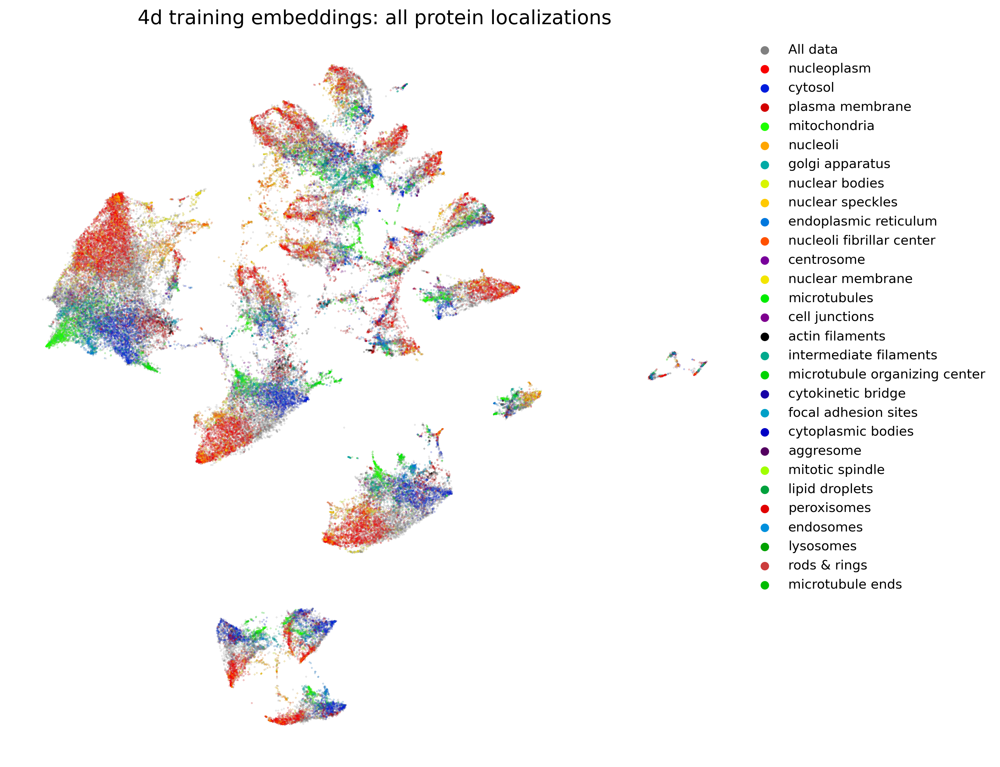

In [53]:
plot_UMAP(train_df, protein_labels, umap_embeddings,  f'4d training embeddings: all protein localizations', color_indices)

/tmp/8129943.1.csg.q/ipykernel_2086597/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


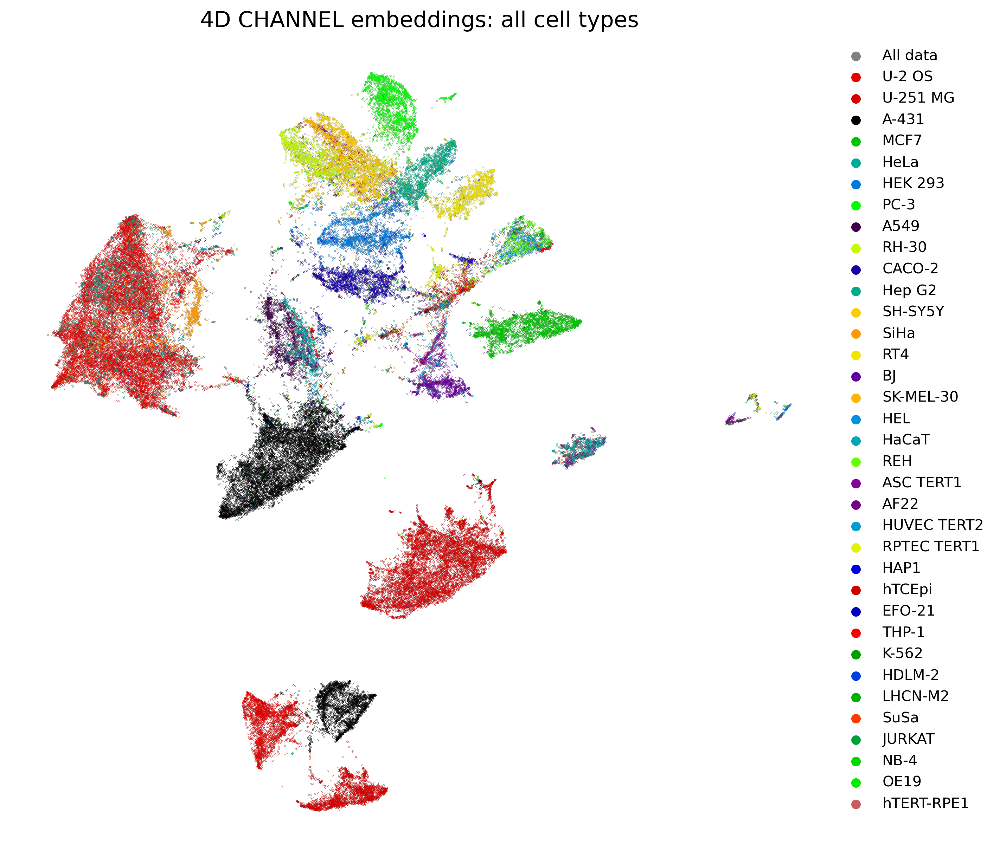

In [50]:
plot_UMAP(train_df, ['cell_type'], umap_embeddings,  f'4D CHANNEL embeddings: all cell types', cell_color_indices)

## Is there an OOD issue?

/tmp/8129943.1.csg.q/ipykernel_2086597/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


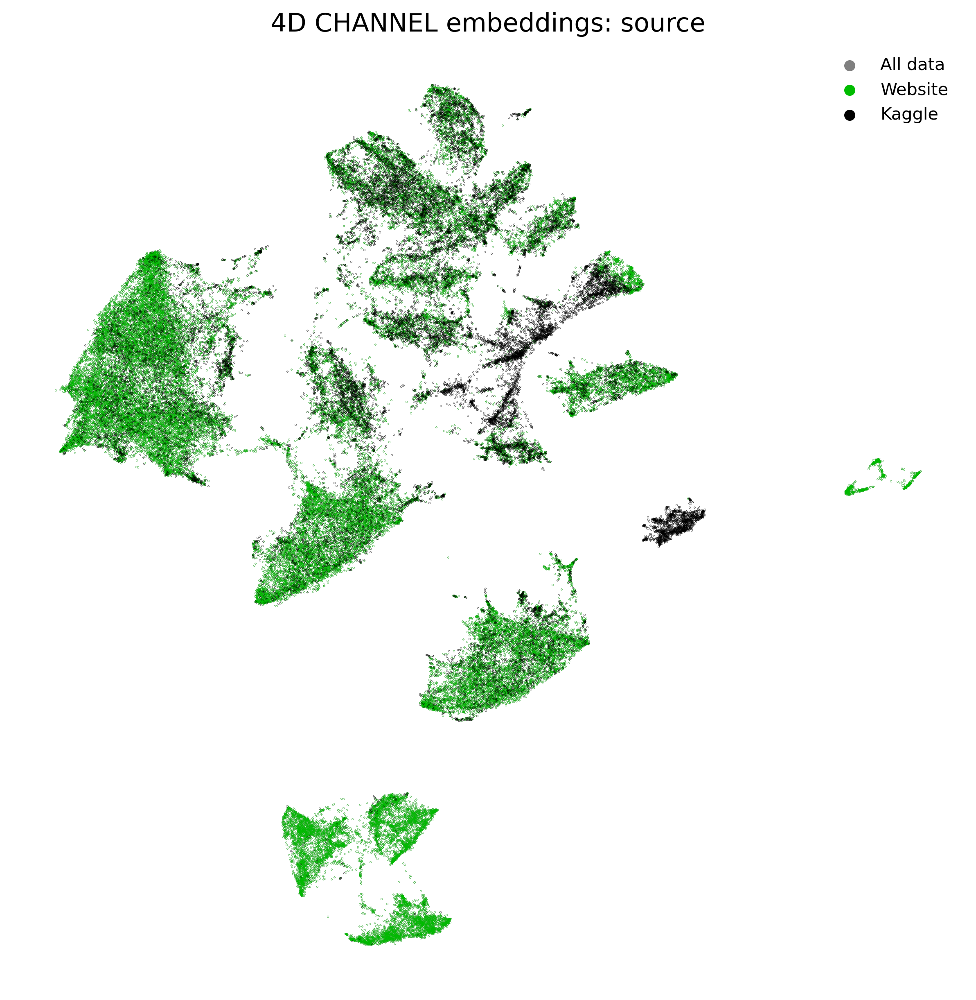

In [55]:
plot_UMAP(train_df, ['source'], umap_embeddings,  f'4D channel embeddings: source', cell_color_indices)

## Re-running classification with 3 epochs, not 100
gle_test.pth

In [ ]:
#CUDA_VISIBLE_DEVICES=1 python run_end_to_end.py --config config_HPA_FOV_retest.yaml

In [ ]:

(dino4cells) wp2181@gpunode01:~/dino4cells_analysis$ mkdir 'results_3epochs'              
(dino4cells) wp2181@gpunode01:~/dino4cells_analysis$ mkdir 'results_3epochs/classification
(dino4cells) wp2181@gpunode01:~/dino4cells_analysis$ CUDA_VISIBLE_DEVICES=1 python run_end
/mnt/vast/hpc/homes/wp2181/dino4cells_analysis/run_end_to_end.py:8: DeprecationWarning:   
Pyarrow will become a required dependency of pandas in the next major release of pandas (p
(to allow more performant data types, such as the Arrow string type, and better interopera
but was not found to be installed on your system.                                         
If this would cause problems for you,                                                     
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466           
                                                                                          
  import pandas as pd                                                                     
Namespace(config='config_HPA_FOV.yaml', checkpoint_frq=50, checksize=3, check_batch=None, 
Output_dir: results_3epochs/, output prefix: classification_output/                       
Sampling 4722 samples per class for 28 classes                                            
scaling training data!                                                                    
scaling validation / testing data!                                                        
Using AdamW optimizer                                                                     
Using Cosine learning rate schedule                                                       
running training...                                                                       
  0%|                                                                                     
atch 0                                                                                    
                                                                                          
atch 10.0, LR: 0.0002, train loss per step: 0.7041:   1%|▋                                
                                                                                          
atch 21.0, LR: 0.0002, train loss per step: 0.6938:   1%|▋                                
                                                                                          
atch 32.0, LR: 0.0002, train loss per step: 0.6834:   1%|▋                                
                                                                                          
atch 43.0, LR: 0.0002, train loss per step: 0.6736:   1%|▋                                
                                                                                          
atch 54.0, LR: 0.0002, train loss per step: 0.6636:   1%|▋                                
                                                                                          
atch 65.0, LR: 0.0001999, train loss per step: 0.6521:   1%|▋                             
                                                                                          
atch 76.0, LR: 0.0001999, train loss per step: 0.6424:   1%|▋                             
                                                                                          
atch 87.0, LR: 0.0001999, train loss per step: 0.6325:   1%|▋                             
                                                                                          
atch 98.0, LR: 0.0001999, train loss per step: 0.6217:   1%|▋                             
                                                                                          
atch 10.0, LR: 0.0001998, train loss per step: 0.6111:   1%|▋                             
                                                                                          
atch 110.0, LR: 0.0001998, train loss per step: 0.5995:   1%|▋                            
                                                                                          
atch 121.0, LR: 0.0001998, train loss per step: 0.5866:   1%|▋                            
                                                                                          
atch 132.0, LR: 0.0001997, train loss per step: 0.5765:   1%|▋                            
                                                                                          
atch 143.0, LR: 0.0001997, train loss per step: 0.5608:   1%|▋                            
                                                                                          
atch 154.0, LR: 0.0001996, train loss per step: 0.551:   1%|▋                             
                                                                                          
atch 165.0, LR: 0.0001996, train loss per step: 0.5377:   1%|▋                            
                                                                                          
atch 176.0, LR: 0.0001995, train loss per step: 0.5229:   1%|▋                            
                                                                                          
atch 187.0, LR: 0.0001995, train loss per step: 0.5094:   1%|▋                            
                                                                                          
atch 198.0, LR: 0.0001994, train loss per step: 0.4939:   1%|▋                            
                                                                                          
atch 209.0, LR: 0.0001994, train loss per step: 0.4765:  11%|██████████████▎              
                                                                                          
atch 210.0, LR: 0.0001993, train loss per step: 0.4624:  11%|██████████████▎              
                                                                                          
atch 221.0, LR: 0.0001992, train loss per step: 0.4479:  11%|██████████████▎              
                                                                                          
atch 232.0, LR: 0.0001992, train loss per step: 0.4347:  11%|██████████████▎              
                                                                                          
atch 243.0, LR: 0.0001991, train loss per step: 0.4132:  11%|██████████████▎              
                                                                                          
atch 254.0, LR: 0.000199, train loss per step: 0.405:  11%|██████████████▌                
                                                                                          
atch 265.0, LR: 0.0001989, train loss per step: 0.3922:  11%|██████████████▎              
                                                                                          
atch 276.0, LR: 0.0001989, train loss per step: 0.3764:  11%|██████████████▎              
                                                                                          
atch 287.0, LR: 0.0001988, train loss per step: 0.3652:  11%|██████████████▎              
                                                                                          
atch 298.0, LR: 0.0001987, train loss per step: 0.3498:  11%|██████████████▎              
                                                                                          
atch 309.0, LR: 0.0001986, train loss per step: 0.3432:  11%|██████████████▎              
                                                                                          
atch 310.0, LR: 0.0001985, train loss per step: 0.324:  17%|██████████████████████▍       
                                                                                          
atch 321.0, LR: 0.0001984, train loss per step: 0.3126:  17%|██████████████████████▏      
                                                                                          
atch 332.0, LR: 0.0001983, train loss per step: 0.3054:  17%|██████████████████████▏      
                                                                                          
atch 343.0, LR: 0.0001982, train loss per step: 0.2944:  17%|██████████████████████▏      
                                                                                          
atch 354.0, LR: 0.0001981, train loss per step: 0.2822:  17%|██████████████████████▏      
                                                                                          
atch 365.0, LR: 0.000198, train loss per step: 0.286:  17%|██████████████████████▌        
                                                                                          
atch 376.0, LR: 0.0001979, train loss per step: 0.2685:  17%|██████████████████████▏      
                                                                                          
atch 387.0, LR: 0.0001977, train loss per step: 0.2614:  20%|███████████████████████████▏ 
                                                                                          
atch 398.0, LR: 0.0001976, train loss per step: 0.2679:  20%|███████████████████████████▏ 
                                                                                          
atch 409.0, LR: 0.0001975, train loss per step: 0.2506:  20%|███████████████████████████▏ 
                                                                                          
atch 410.0, LR: 0.0001974, train loss per step: 0.2544:  20%|███████████████████████████▏ 
                                                                                          
atch 421.0, LR: 0.0001972, train loss per step: 0.2573:  20%|███████████████████████████▏ 
                                                                                          
atch 432.0, LR: 0.0001971, train loss per step: 0.2512:  23%|█████████████████████████████
                                                                                          
atch 443.0, LR: 0.000197, train loss per step: 0.2467:  23%|██████████████████████████████
                                                                                          
atch 454.0, LR: 0.0001968, train loss per step: 0.2446:  23%|█████████████████████████████
                                                                                          
atch 465.0, LR: 0.0001967, train loss per step: 0.2447:  23%|█████████████████████████████
                                                                                          
atch 476.0, LR: 0.0001966, train loss per step: 0.2402:  25%|█████████████████████████████
                                                                                          
atch 487.0, LR: 0.0001964, train loss per step: 0.2378:  25%|█████████████████████████████
                                                                                          
atch 498.0, LR: 0.0001963, train loss per step: 0.2458:  25%|█████████████████████████████
                                                                                          
atch 509.0, LR: 0.0001961, train loss per step: 0.2458:  25%|█████████████████████████████
                                                                                          
atch 510.0, LR: 0.0001959, train loss per step: 0.2387:  25%|█████████████████████████████
                                                                                          
atch 521.0, LR: 0.0001958, train loss per step: 0.2423:  28%|█████████████████████████████
                                                                                          
atch 532.0, LR: 0.0001956, train loss per step: 0.2317:  28%|█████████████████████████████
                                                                                          
atch 543.0, LR: 0.0001955, train loss per step: 0.2305:  28%|█████████████████████████████
                                                                                          
atch 554.0, LR: 0.0001953, train loss per step: 0.2344:  28%|█████████████████████████████
                                                                                          
atch 565.0, LR: 0.0001951, train loss per step: 0.2311:  30%|█████████████████████████████
                                                                                          
atch 576.0, LR: 0.0001949, train loss per step: 0.2393:  30%|█████████████████████████████
                                                                                          
atch 587.0, LR: 0.0001948, train loss per step: 0.2331:  30%|█████████████████████████████
                                                                                          
atch 598.0, LR: 0.0001946, train loss per step: 0.229:  30%|██████████████████████████████
                                                                                          
atch 609.0, LR: 0.0001944, train loss per step: 0.2393:  30%|█████████████████████████████
                                                                                          
atch 610.0, LR: 0.0001942, train loss per step: 0.2265:  30%|█████████████████████████████
                                                                                          
atch 621.0, LR: 0.000194, train loss per step: 0.2324:  33%|██████████████████████████████
                                                                                          
atch 632.0, LR: 0.0001938, train loss per step: 0.2282:  33%|█████████████████████████████
                                                                                          
atch 643.0, LR: 0.0001936, train loss per step: 0.227:  33%|██████████████████████████████
                                                                                          
atch 654.0, LR: 0.0001934, train loss per step: 0.2246:  33%|█████████████████████████████
                                                                                          
atch 665.0, LR: 0.0001932, train loss per step: 0.2249:  35%|█████████████████████████████
                                                                                          
atch 676.0, LR: 0.000193, train loss per step: 0.2229:  35%|██████████████████████████████
                                                                                          
atch 687.0, LR: 0.0001928, train loss per step: 0.2231:  35%|█████████████████████████████
                                                                                          
atch 698.0, LR: 0.0001926, train loss per step: 0.2214:  35%|█████████████████████████████
                                                                                          
atch 709.0, LR: 0.0001924, train loss per step: 0.2192:  35%|█████████████████████████████
                                                                                          
atch 710.0, LR: 0.0001922, train loss per step: 0.2202:  35%|█████████████████████████████
                                                                                          
atch 721.0, LR: 0.000192, train loss per step: 0.223:  39%|███████████████████████████████
                                                                                          
atch 732.0, LR: 0.0001918, train loss per step: 0.2174:  39%|█████████████████████████████
                                                                                          
atch 743.0, LR: 0.0001915, train loss per step: 0.2201:  39%|█████████████████████████████
                                                                                          
atch 754.0, LR: 0.0001913, train loss per step: 0.2176:  39%|█████████████████████████████
                                                                                          
                                                                                          
atch 776.0, LR: 0.0001908, train loss per step: 0.2179:  41%|█████████████████████████████
                                                                                          
                                                                                          
atch 798.0, LR: 0.0001904, train loss per step: 0.2153:  41%|█████████████████████████████
                                                                                          
atch 809.0, LR: 0.0001901, train loss per step: 0.2159:  41%|█████████████████████████████
                                                                                          
atch 810.0, LR: 0.0001899, train loss per step: 0.2181:  41%|█████████████████████████████
                                                                                          
atch 821.0, LR: 0.0001896, train loss per step: 0.2142:  44%|█████████████████████████████
                                                                                          
atch 832.0, LR: 0.0001894, train loss per step: 0.2179:  44%|█████████████████████████████
                                                                                          
atch 843.0, LR: 0.0001891, train loss per step: 0.2104:  44%|█████████████████████████████
                                                                                          
atch 854.0, LR: 0.0001889, train loss per step: 0.2116:  44%|█████████████████████████████
                                                                                          
atch 865.0, LR: 0.0001886, train loss per step: 0.213:  46%|██████████████████████████████
                                                                                          
atch 876.0, LR: 0.0001884, train loss per step: 0.209:  46%|██████████████████████████████
                                                                                          
                                                                                          
atch 898.0, LR: 0.0001878, train loss per step: 0.2118:  46%|█████████████████████████████
atch 909.0, LR: 0.0001876, train loss per step: 0.2129:  46%|█████████████████████████████
                                                                                          
atch 910.0, LR: 0.0001873, train loss per step: 0.2109:  46%|█████████████████████████████
                                                                                          
atch 921.0, LR: 0.000187, train loss per step: 0.2109:  46%|██████████████████████████████
                                                                                          
atch 932.0, LR: 0.0001867, train loss per step: 0.213:  46%|██████████████████████████████
                                                                                          
atch 943.0, LR: 0.0001865, train loss per step: 0.2112:  46%|█████████████████████████████
                                                                                          
atch 954.0, LR: 0.0001862, train loss per step: 0.2093:  46%|█████████████████████████████
                                                                                          
atch 965.0, LR: 0.0001859, train loss per step: 0.2082:  51%|█████████████████████████████
                                                                                          
atch 976.0, LR: 0.0001856, train loss per step: 0.2054:  51%|█████████████████████████████
                                                                                          
atch 987.0, LR: 0.0001853, train loss per step: 0.2061:  51%|█████████████████████████████

In [ ]:
epoch: 2.0, train loss per epoch: 0.151: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:37<00:00, 12.66s/ epochs]Final models saved to results_3epochs//classification_output//
                                                                                                                                                                                                                                         [0.30486613 0.12675696 0.09866437 0.         0.03461889 0.
 0.65663993 0.42863561 0.71216617 0.20158192 0.00339047 0.10805861
 0.         0.68447061 0.2001576  0.         0.76764162 0.55734744
 0.15498    0.05832399 0.66656337 0.33812593 0.35464275 0.
 0.79962411 0.45696811 0.51458019 0.        ]
                                                                                                                                                                                                                                         [0.29295775 0.25263158 0.02272727 0.         0.         0.
 0.71915737 0.49100257 0.13580247 0.20289855 0.00977199 0.15168539
 0.         0.11320755 0.         0.         0.79603399 0.60188679
 0.         0.         0.68458274 0.34949495 0.33436533 0.
 0.86741224 0.4137931  0.54303205 0.        ]
train score: 0.2938858853434964, valid score: 0.2493729887691753
train loss: 0.13472075720521856, valid loss: 0.09444270903865497

In [ ]:
Re-creating submission file: `CUDA_VISIBLE_DEVICES=1 python ../ndv_dino4cells_analysis/prepare_kaggle_submission.py --config config_HPA_FOV.yaml`

In [ ]:
results_3epochs//classification_output//classifier_final_protein_whole.pth

Result is 0.06, worse than before

In [60]:
`

In [62]:
len(test_features[0][0])

384

In [65]:
umap_embeddings

array([[-0.8074907,  6.514154 ],
       [-1.0374184,  6.355425 ],
       [-7.0749846,  9.753919 ],
       ...,
       [ 7.2907753,  6.24038  ],
       [ 7.203964 ,  5.623313 ],
       [ 3.826727 ,  9.032955 ]], dtype=float32)

In [ ]:
UMAP = umap.UMAP(n_neighbors=30, min_dist=0.6, negative_sample_rate=8, metric='correlation').fit(umap_embeddings)

/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/pynndescent/rp_trees.py:1091: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your graph_data, and this may take longer than normal to compute.
  warn(


### Umap work
import umap

# Assume you have two datasets: dataset1 and dataset2
# dataset1 is used to train the UMAP model

# Fit UMAP on dataset1
reducer = umap.UMAP(random_state=42)
embedding_dataset1 = reducer.fit_transform(dataset1)

# Project dataset2 into the same UMAP embedding space
embedding_dataset2 = reducer.transform(dataset2)

In [6]:
test_embeddings = torch.load('/home/wp2181/dino4cells_analysis/results/2024-28-01_fovHPA_VITs//test_umap_embeddings_DINO_features_for_HPA_FOV_Kaggle.pth')

In [7]:
len(test_embeddings)

11702

/tmp/8129943.1.csg.q/ipykernel_2106353/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


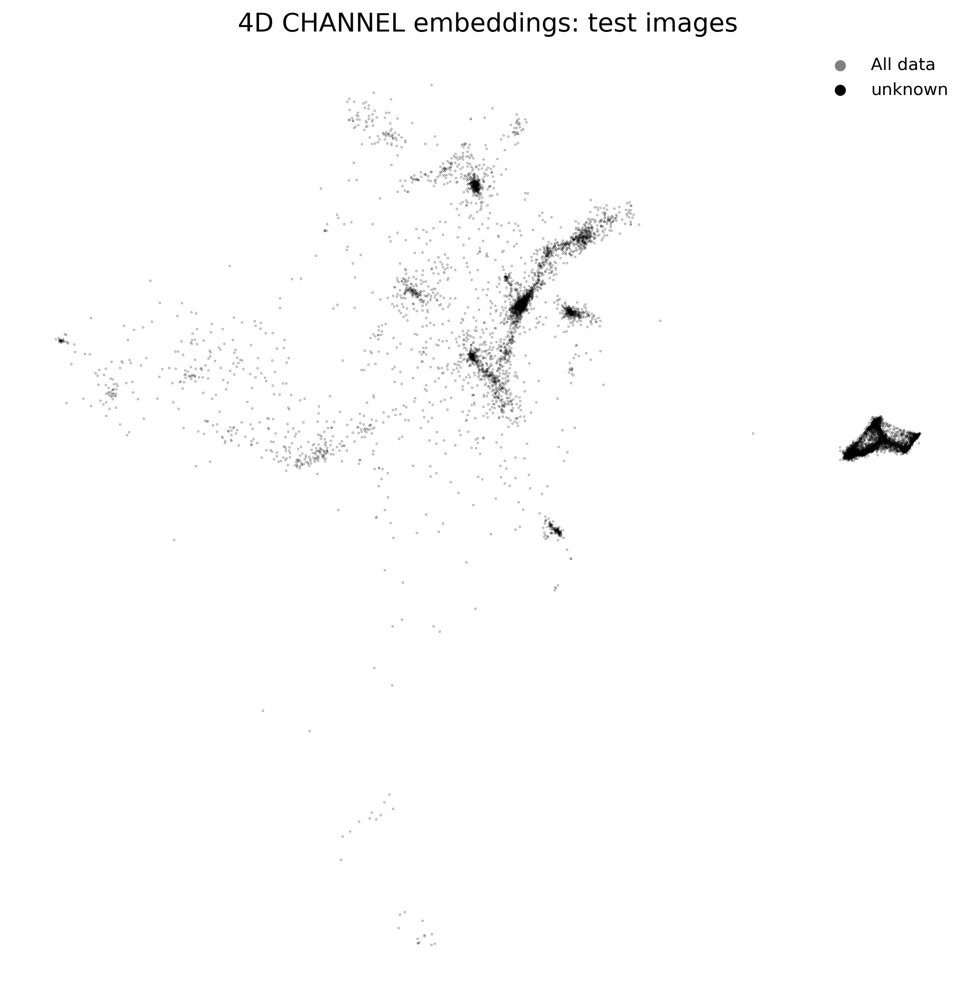

In [30]:
# looks like the function is using the test_df cell_label column to color the data points. 
# Instead, we should plot the train/valid data as the reference (say in gray) and the test data on top in a different color. 
# like using this as above: plot_UMAP(train_df, ['source'], umap_embeddings,  f'4D channel embeddings: source', cell_color_indices)
# but with the test data as a separate "source" category

plot_UMAP(test_df, ['cell_label'], test_embeddings,  f'4D CHANNEL embeddings: test images', color_indices)

In [40]:
test_df = test

In [59]:
test_df['is_test']='true'

In [41]:
test_df['cell_type'] = 'unknown'

In [31]:
# looks like the function is using the test_df cell_label column to color the data points. 
# Instead, we should plot the train/valid data as the reference (say in gray) and the test data on top in a different color. 
# like using this as above: plot_UMAP(train_df, ['source'], umap_embeddings,  f'4D channel embeddings: source', cell_color_indices)
# but with the test data as a separate "source" category

In [60]:
combined_df = pd.concat([train_df, test_df])

In [53]:
test_embeddings[0:3]

array([[ 2.2493515, 14.80956  ],
       [12.073795 ,  7.1928453],
       [12.000547 ,  7.1509705]], dtype=float32)

In [55]:
train_and_test_embeddings = np.concatenate([umap_embeddings, test_embeddings])

/tmp/8129943.1.csg.q/ipykernel_2106353/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


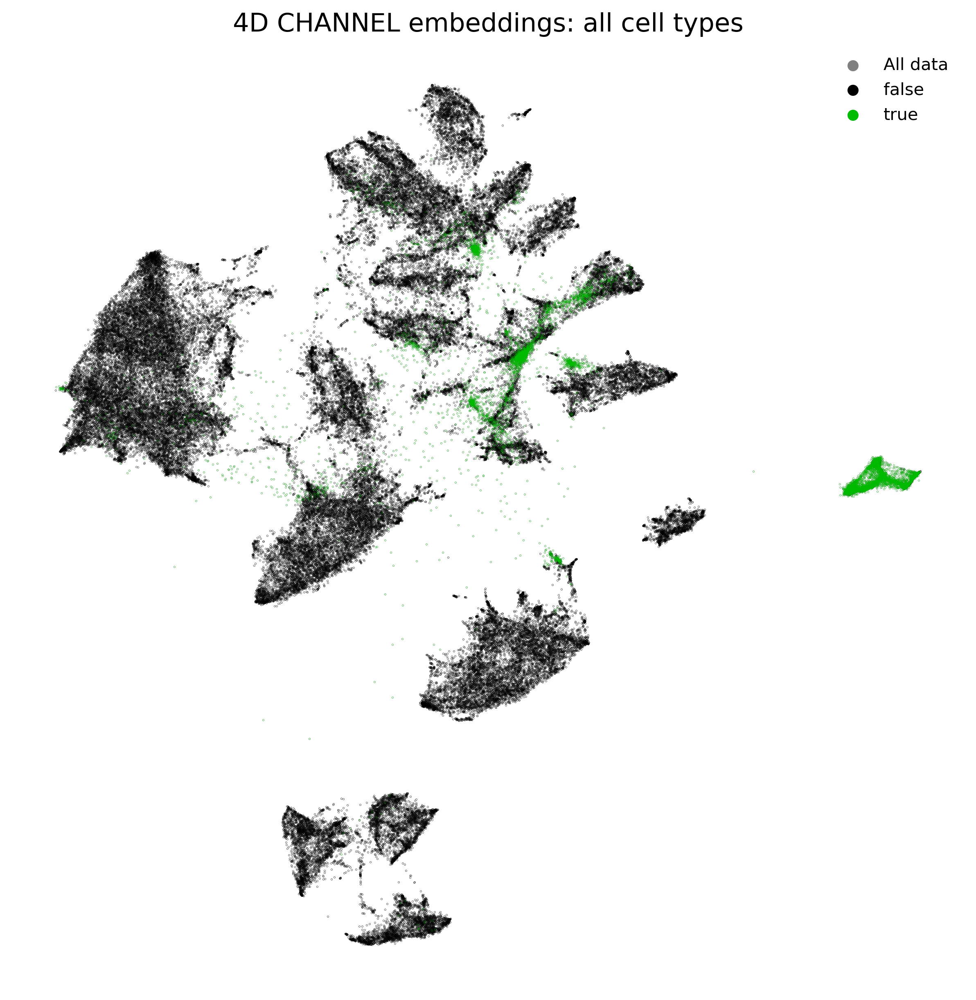

In [61]:
plot_UMAP(combined_df, ['is_test'], train_and_test_embeddings,  f'4D CHANNEL embeddings: all cell types', cell_color_indices)

In [58]:
train_df['is_test'] = 'false'

/tmp/8129943.1.csg.q/ipykernel_2106353/418536919.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['is_test'] = 'false'


In [68]:
test_df

,file,ID,cell_label,cell_type,is_test
0,/home/nick/kaggle_data/test/00008af0-bad0-11e8...,00008af0-bad0-11e8-b2b8-ac1f6b6435d0,unknown,unknown,true
1,/home/nick/kaggle_data/test/0000a892-bacf-11e8...,0000a892-bacf-11e8-b2b8-ac1f6b6435d0,unknown,unknown,true
2,/home/nick/kaggle_data/test/0006faa6-bac7-11e8...,0006faa6-bac7-11e8-b2b7-ac1f6b6435d0,unknown,unknown,true
3,/home/nick/kaggle_data/test/0008baca-bad7-11e8...,0008baca-bad7-11e8-b2b9-ac1f6b6435d0,unknown,unknown,true
4,/home/nick/kaggle_data/test/000cce7e-bad4-11e8...,000cce7e-bad4-11e8-b2b8-ac1f6b6435d0,unknown,unknown,true
...,...,...,...,...,...
11697,/home/nick/kaggle_data/test/ffdfb96a-bad4-11e8...,ffdfb96a-bad4-11e8-b2b8-ac1f6b6435d0,unknown,unknown,true
11698,/home/nick/kaggle_data/test/ffdfc590-bad4-11e8...,ffdfc590-bad4-11e8-b2b8-ac1f6b6435d0,unknown,unknown,true
11699,/home/nick/kaggle_data/test/ffecb8a4-bad4-11e8...,ffecb8a4-bad4-11e8-b2b8-ac1f6b6435d0,unknown,unknown,true
11700,/home/nick/kaggle_data/test/fff03816-bad5-11e8...,fff03816-bad5-11e8-b2b9-ac1f6b6435d0,unknown,unknown,true


## Zenodo Sanity Checks

In [ ]:
In the meantime, getting data from zenodo
CD /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images$ wget https://zenodo.org/records/8061392/files/HPA_FOV_data.tar.gz

In the zenodo data, we should have the dino output pths (embeddings), and so we can visualize umap, load the classifier weight, and upload to kaggle. 

In [63]:
features = torch.load('/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_data/pretrained_DINO_features_for_HPA_FOV.pth')

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3553, in run_code
  File "/tmp/8129943.1.csg.q/ipykernel_2106353/3949856510.py", line 1, in <module>
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/serialization.py", line 1014, in load
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/serialization.py", line 1422, in _load
MemoryError

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 2144, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/IPython/core/ultratb.py", line 1448, in structured_traceback
  File 

In [64]:
features = torch.load('/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_data/DINO_features_for_HPA_FOV.pth')

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3553, in run_code
  File "/tmp/8129943.1.csg.q/ipykernel_2106353/3981754760.py", line 1, in <module>
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/serialization.py", line 986, in load
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/serialization.py", line 435, in _open_file_like
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/serialization.py", line 416, in __init__
MemoryError

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 2144, in showtraceback
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/IPython/core/ultratb.py", line 1448, i

Need to get features from the test images

In [2]:
images = pd.read_csv('/mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_data/whole_images.csv')

In [3]:
images

,Unnamed: 0,file,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,nucleoli fibrillar center,nuclear speckles,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,0,/scr/mdoron/Dino4Cells/data/whole_images/49232...,['vesicles'],A-431,49232_769_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1,/scr/mdoron/Dino4Cells/data/whole_images/49232...,['vesicles'],A-431,49232_769_H3_11,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2,/scr/mdoron/Dino4Cells/data/whole_images/49232...,['vesicles'],U-2 OS,49232_761_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,3,/scr/mdoron/Dino4Cells/data/whole_images/49232...,['vesicles'],U-2 OS,49232_761_H3_2,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,4,/scr/mdoron/Dino4Cells/data/whole_images/49232...,['vesicles'],U-251 MG,49232_757_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117878,117878,/scr/mdoron/Dino4Cells/data/whole_images/ffed4...,['plasma membrane'],ASC TERT1,ffed4430-bbac-11e8-b2ba-ac1f6b6435d0,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
117879,117879,/scr/mdoron/Dino4Cells/data/whole_images/fff0a...,['nuclear bodies'],BJ,fff0a998-bbae-11e8-b2ba-ac1f6b6435d0,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
117880,117880,/scr/mdoron/Dino4Cells/data/whole_images/fff18...,['golgi apparatus'],HeLa,fff189d8-bbab-11e8-b2ba-ac1f6b6435d0,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
117881,117881,/scr/mdoron/Dino4Cells/data/whole_images/fffdf...,"['cytosol', 'nucleoli', 'plasma membrane']",A-431,fffdf7e0-bbc4-11e8-b2bc-ac1f6b6435d0,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
(dino4cells) wp2181@gpunode01:~/dino4cells_analysis$ cp config_HPA_FOV.yaml ../ndv_dino4cells_analysis/exploratory_configs/config_Zenodo_recap_03_02_2024_HPA_FOV.yaml

In [ ]:
CUDA_VISIBLE_DEVICES=2 python run_get_features.py --config ../ndv_dino4cells_analysis/exploratory_configs/config_Zenodo_recap_03_02_2024_HPA_FOV.yaml

In [4]:
# lets check, does this include test images?

In [ ]:
# with vit_small set in .yaml
Please
see line 55 in run_get_embeddings.py for additional arguments that can be used to run the full backbone+HEAD model
loaded /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_data/DINO_FOV_checkpoint.pth
Traceback (most recent call last):
  File "/mnt/vast/hpc/homes/wp2181/dino4cells_analysis/run_get_features.py", line 128, in <module>
    msg = model.load_state_dict(teacher, strict=False)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/nn/modules/module.py", line 2152, in load_state_dict
    raise RuntimeError('Error(s) in loading state_dict for {}:\n\t{}'.format(
RuntimeError: Error(s) in loading state_dict for VisionTransformer:
        size mismatch for cls_token: copying a param with shape torch.Size([1, 1, 768]) from checkpoint, the shape in current model is torch.Size([1, 1, 384]).
        size mismatch for pos_embed: copying a param with shape torch.Size([1, 785, 768]) from checkpoint, the shape in current model is torch.Size([1, 197, 384]).
        size mismatch for patch_embed.proj.weight: copying a param with shape torch.Size([768, 4, 8, 8]) from checkpoint, the shape in current model is torch.Size([384, 4, 16, 16]).
        size mismatch for patch_embed.proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([384]).
        size mismatch for blocks.0.norm1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([384]).

In [6]:
# with vit_base set in .yaml

loaded /mnt/vast/hpc/LDB/LDB_data/microscopy/HPA/whole_images/HPA_FOV_data/DINO_FOV_checkpoint.pth
Traceback (most recent call last):
  File "/mnt/vast/hpc/homes/wp2181/dino4cells_analysis/run_get_features.py", line 128, in <module>
    msg = model.load_state_dict(teacher, strict=False)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/wp2181/miniconda3/envs/dino4cells/lib/python3.11/site-packages/torch/nn/modules/module.py", line 2152, in load_state_dict
    raise RuntimeError('Error(s) in loading state_dict for {}:\n\t{}'.format(
RuntimeError: Error(s) in loading state_dict for VisionTransformer:
        size mismatch for pos_embed: copying a param with shape torch.Size([1, 785, 768]) from checkpoint, the shape in current model is torch.Size([1, 197, 768]).
        size mismatch for patch_embed.proj.weight: copying a param with shape torch.Size([768, 4, 8, 8]) from checkpoint, the shape in current model is torch.Size([768, 4, 16, 16]).                                                                                                                                                     

FileNotFoundError: [Errno 2] No such file or directory: '/export/scratch/LDB/data/microscopy/HPA/whole_images/Master_fovHPA_512.csv'